<div align="center">
  <img src="https://raw.githubusercontent.com/vprusso/toqito/cfb62c4a5ce04b782f64229e7acd2b1c97f09801/docs/figures/logo.svg" alt="toqito logo" width="240"/>
</div>

<font size=6><center><b>Geometric Quantum State Discrimination with <code>|toqito></code></b></center></font>

<font size=4><center><i>SIC-POVM intuition, optimization, and figure-style visual recreations</i></center></font>


<font size=3><center>Project repository: <a href="https://github.com/vprusso/toqito/">|toqito></a> by <strong>Vincent Russo</strong>.</center></font>

---

### Notebook Roadmap

0. [Preamble](#preamble)  
1. [SIC-POVM background and geometry](#sic-povm)  
2. [Helper functions](#helpers)  
3. [Qubit SIC example (tetrahedron)](#qubit-sic)  
4. [Discrimination with <code>|toqito></code>: optimal vs PGM](#discrimination)  
5. [Geometric QSD](#fig1)  
6. [Performance comparison](#fig2)  
7. [Animation: moving-state geometry](#animation)  
8. [Takeaways](#takeaways)


# Preamble <a name="preamble"></a>

This notebook builds geometric intuition for **minimum-error quantum state discrimination (QSD)** and demonstrates practical workflows in `toqito`:

- `toqito.state_opt.state_distinguishability` for SDP-based optimal success probability,
- `toqito.measurements.pretty_good_measurement` for the PGM heuristic,
- Bloch-sphere and overlap visualizations for symmetric ensembles.

> **Note:** We additionally include two visual sections inspired by typical geometric QSD paper figures (state-geometry panel + performance-comparison panel), adapted for a tutorial setting.

In [1]:
# Optional setup (safe to keep even if packages are already available):
%pip install toqito==1.1.2

import numpy as np
import matplotlib.pyplot as plt

from toqito.state_opt import state_distinguishability
from toqito.measurements import pretty_good_measurement

# SIC-POVM background and geometry <a name="sic-povm"></a>

A **SIC-POVM** (Symmetric Informationally Complete POVM) in dimension $d$ is a set of $d^2$ rank-1 effects

$$
E_i = \frac{1}{d} |\psi_i
\rangle\langle\psi_i|,\qquad i=1,\dots,d^2
$$

with constant pairwise overlaps
$$
|\langle\psi_i|\psi_j\rangle|^2 =
\frac{1}{d+1},\quad i\neq j.
$$

Why this matters for QSD tutorials:

- SIC ensembles are maximally symmetric and therefore geometrically clean.
- They give compact examples where overlap structure is explicit and easy to visualize.
- They are an excellent benchmark for comparing **optimal SDP discrimination** vs. **PGM**.

For qubits ($d=2$), a SIC corresponds to four pure states whose Bloch vectors are the vertices of a regular tetrahedron.

# Helper functions <a name="helpers"></a>

In [2]:
def bloch_to_density(n: np.ndarray) -> np.ndarray:
    """Map a Bloch vector n in R^3 to a qubit density matrix."""
    n = np.asarray(n, dtype=float).reshape(3)
    sx = np.array([[0, 1], [1, 0]], dtype=complex)
    sy = np.array([[0, -1j], [1j, 0]], dtype=complex)
    sz = np.array([[1, 0], [0, -1]], dtype=complex)
    ident = np.eye(2, dtype=complex)
    return 0.5 * (ident + n[0] * sx + n[1] * sy + n[2] * sz)


def density_to_bloch(rho: np.ndarray) -> np.ndarray:
    """Map a qubit density matrix rho to Bloch vector components."""
    sx = np.array([[0, 1], [1, 0]], dtype=complex)
    sy = np.array([[0, -1j], [1j, 0]], dtype=complex)
    sz = np.array([[1, 0], [0, -1]], dtype=complex)
    return np.array([
        np.real(np.trace(rho @ sx)),
        np.real(np.trace(rho @ sy)),
        np.real(np.trace(rho @ sz)),
    ])


def calculate_success_prob(states, probs, povm_ops):
    """Compute success probability sum_i p_i Tr[M_i rho_i]."""
    return float(np.real(sum(p * np.trace(m @ rho) for p, m, rho in zip(probs, povm_ops, states))))


def plot_bloch_vectors(vectors, title="Bloch vectors", ax=None, color="tab:blue", label=None):
    """Draw Bloch sphere + vectors."""
    if ax is None:
        fig = plt.figure(figsize=(6, 6))
        ax = fig.add_subplot(111, projection='3d')

    u = np.linspace(0, 2 * np.pi, 60)
    v = np.linspace(0, np.pi, 30)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones_like(u), np.cos(v))
    ax.plot_surface(x, y, z, alpha=0.12, color='lightgray', linewidth=0)

    vectors = np.asarray(vectors, dtype=float)
    for vec in vectors:
        ax.plot([0, vec[0]], [0, vec[1]], [0, vec[2]], color=color, lw=2)
    ax.scatter(vectors[:, 0], vectors[:, 1], vectors[:, 2], color=color, s=60, label=label)

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_box_aspect((1, 1, 1))
    ax.set_title(title)
    return ax

# Qubit SIC example (tetrahedron) <a name="qubit-sic"></a>

We choose tetrahedral Bloch vectors

$$
\begin{aligned}
|\psi_1\rangle &= \frac{(1,1,1)}{\sqrt{3}},\\
|\psi_2\rangle &= \frac{(1,-1,-1)}{\sqrt{3}},\\
|\psi_3\rangle &= \frac{(-1,1,-1)}{\sqrt{3}},\\
|\psi_4\rangle &= \frac{(-1,-1,1)}{\sqrt{3}}
\end{aligned}
$$

which satisfy the qubit SIC condition
$\mathrm{Tr}(
\rho_i
\rho_j)=1/3$ for all $i
\neq j$.

In [3]:
tetra = np.array([
    [ 1,  1,  1],
    [ 1, -1, -1],
    [-1,  1, -1],
    [-1, -1,  1],
], dtype=float) / np.sqrt(3)

states_sic = [bloch_to_density(n) for n in tetra]
probs_sic = [1/4] * 4

overlaps_sic = np.array([[np.real(np.trace(a @ b)) for b in states_sic] for a in states_sic])

print("Purities Tr(rho_i^2):")
for i, rho in enumerate(states_sic):
    print(f"  state {i}: {np.real(np.trace(rho @ rho)):.6f}")

print("\nPairwise overlaps Tr(rho_i rho_j):")
print(np.round(overlaps_sic, 6))

Purities Tr(rho_i^2):
  state 0: 1.000000
  state 1: 1.000000
  state 2: 1.000000
  state 3: 1.000000

Pairwise overlaps Tr(rho_i rho_j):
[[1.       0.333333 0.333333 0.333333]
 [0.333333 1.       0.333333 0.333333]
 [0.333333 0.333333 1.       0.333333]
 [0.333333 0.333333 0.333333 1.      ]]


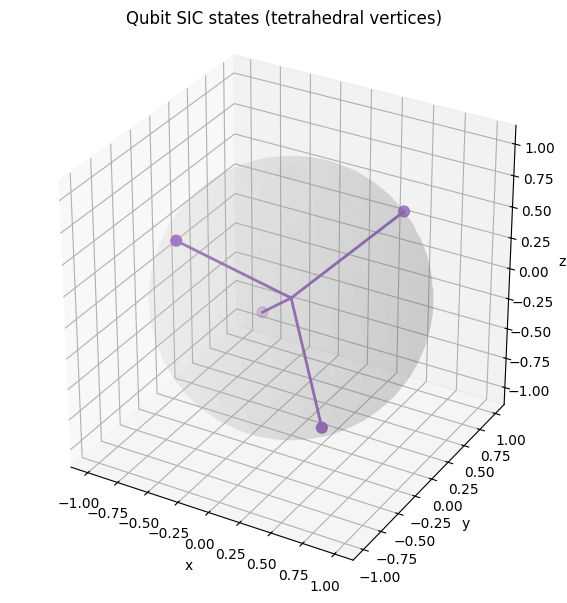

In [4]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
plot_bloch_vectors(tetra, title='Qubit SIC states (tetrahedral vertices)', ax=ax, color='tab:purple')
plt.tight_layout()
plt.show()

# Discrimination with <code>toqito</code>: optimal vs PGM <a name="discrimination"></a>

We demonstrated some toqito's discrimination functions as follows.

In [5]:
# Optimal success probability via SDP:
p_best_sic, povm_opt_sic = state_distinguishability(states_sic, probs_sic)

# Pretty Good Measurement POVM and induced success probability:
pgm_sic = pretty_good_measurement(states_sic, probs_sic)
p_pgm_sic = calculate_success_prob(states_sic, probs_sic, pgm_sic)

print(f"SIC ensemble: P_best = {float(p_best_sic):.6f}")
print(f"SIC ensemble: P_pgm  = {float(p_pgm_sic):.6f}")

SIC ensemble: P_best = 0.500000
SIC ensemble: P_pgm  = 0.500000


# Geometric QSD  <a name="fig1"></a>

We demonstrated geometric QSD such as state constellations/convex geometry by comparing two symmetric qubit ensembles:

- **Trine states** (equatorial triangle),
- **SIC tetrahedron** (regular tetrahedron).

We can create a side-by-side Bloch visualization as follows.

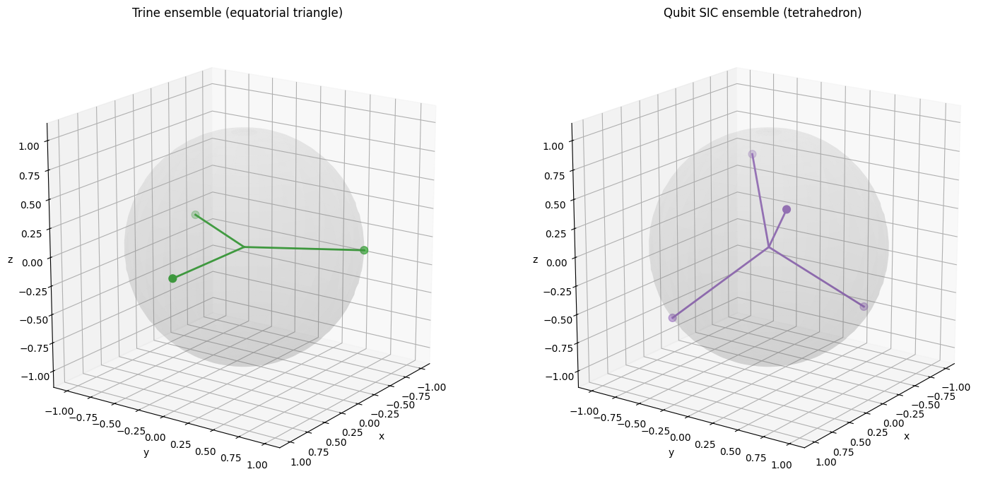

In [6]:
# Trine states on equator (120-degree separated):
angles = np.array([0, 2*np.pi/3, 4*np.pi/3])
trine = np.stack([np.cos(angles), np.sin(angles), np.zeros_like(angles)], axis=1)

fig = plt.figure(figsize=(15, 7))
ax1 = fig.add_subplot(121, projection='3d')
plot_bloch_vectors(trine, title='Trine ensemble (equatorial triangle)', ax=ax1, color='tab:green')
ax1.view_init(elev=18, azim=35)

ax2 = fig.add_subplot(122, projection='3d')
plot_bloch_vectors(tetra, title='Qubit SIC ensemble (tetrahedron)', ax=ax2, color='tab:purple')
ax2.view_init(elev=18, azim=35)

plt.tight_layout()
plt.show()

# Performance comparision of different distinguishability schemes <a name="fig2"></a>

We can scan a one-parameter family of binary ensembles and compare:

- **Optimal SDP value** (`state_distinguishability`),
- **PGM success probability** (`pretty_good_measurement`).

Family used: two pure qubit states with equal priors, where the Bloch angle $\theta\in[0,\pi]$ controls distinguishability.

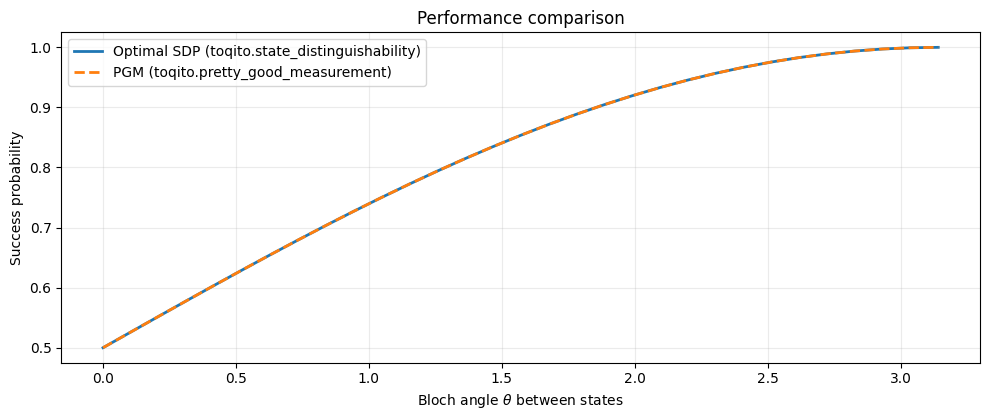

In [7]:
def pure_state_from_bloch(theta):
    """Return a pure qubit density matrix with Bloch vector (sin theta, 0, cos theta)."""
    n = np.array([np.sin(theta), 0.0, np.cos(theta)])
    return bloch_to_density(n)

thetas = np.linspace(0, np.pi, 31)
opt_vals, pgm_vals = [], []

for theta in thetas:
    rho0 = pure_state_from_bloch(0.0)
    rho1 = pure_state_from_bloch(theta)
    states = [rho0, rho1]
    probs = [0.5, 0.5]

    p_opt, _ = state_distinguishability(states, probs)
    m_pgm = pretty_good_measurement(states, probs)
    p_pgm = calculate_success_prob(states, probs, m_pgm)

    opt_vals.append(float(p_opt))
    pgm_vals.append(float(p_pgm))

fig, ax = plt.subplots(figsize=(10, 4.3))
ax.plot(thetas, opt_vals, lw=2, label='Optimal SDP (toqito.state_distinguishability)')
ax.plot(thetas, pgm_vals, '--', lw=2, label='PGM (toqito.pretty_good_measurement)')
ax.set_xlabel(r'Bloch angle $\theta$ between states')
ax.set_ylabel('Success probability')
ax.set_title('Performance comparison')
ax.grid(alpha=0.25)
ax.legend()
plt.tight_layout()
plt.show()

# Animation: moving-state geometry <a name="animation"></a>

This animation shows a **binary qubit discrimination** scenario where one state is fixed and the other moves on the Bloch sphere.

At each frame, we compute a `|toqito>`-based measurement with:

- `pretty_good_measurement(states, probs)`

and display the resulting instantaneous success probability
$P_\mathrm{PGM} = \sum_i p_i \operatorname{Tr}(M_i\rho_i)$.

This gives a geometry-first view of how discrimination performance changes with state separation.



In [8]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Fixed state at north pole; moving state traces a latitude circle.
rho_fixed = bloch_to_density(np.array([0.0, 0.0, 1.0]))
probs_bin = [0.5, 0.5]

phis = np.linspace(0, 2*np.pi, 80)
theta = np.pi / 3  # fixed polar angle for moving state

fig = plt.figure(figsize=(7.2, 6.2))
ax = fig.add_subplot(111, projection='3d')

u = np.linspace(0, 2 * np.pi, 60)
v = np.linspace(0, np.pi, 30)
x = np.outer(np.cos(u), np.sin(v))
y = np.outer(np.sin(u), np.sin(v))
z = np.outer(np.ones_like(u), np.cos(v))


def frame_data(phi):
    moving_vec = np.array([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta),
    ])
    rho_moving = bloch_to_density(moving_vec)
    states = [rho_fixed, rho_moving]

    # toqito example function call per frame:
    pgm_ops = pretty_good_measurement(states, probs_bin)
    p_pgm = calculate_success_prob(states, probs_bin, pgm_ops)
    return moving_vec, p_pgm


def update(k):
    ax.clear()
    ax.plot_surface(x, y, z, alpha=0.10, color='lightgray', linewidth=0)

    moving_vec, p_pgm = frame_data(phis[k])

    fixed_vec = np.array([0.0, 0.0, 1.0])

    # Draw vectors and endpoints
    ax.plot([0, fixed_vec[0]], [0, fixed_vec[1]], [0, fixed_vec[2]], color='tab:blue', lw=3)
    ax.plot([0, moving_vec[0]], [0, moving_vec[1]], [0, moving_vec[2]], color='tab:red', lw=3)

    ax.scatter([fixed_vec[0]], [fixed_vec[1]], [fixed_vec[2]], color='tab:blue', s=80, label=r'$\rho_0$ (fixed)')
    ax.scatter([moving_vec[0]], [moving_vec[1]], [moving_vec[2]], color='tab:red', s=80, label=r'$\rho_1$ (moving)')

    ax.set_title(f'Moving-state geometry with toqito PGM  |  P_PGM = {p_pgm:.4f}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_box_aspect((1, 1, 1))
    ax.legend(loc='upper left')
    ax.view_init(elev=20, azim=35)


ani = FuncAnimation(fig, update, frames=len(phis), interval=100, blit=False)
plt.close(fig)

HTML(ani.to_jshtml())

# Takeaways <a name="takeaways"></a>

- SIC-POVMs provide a canonical symmetric testbed for geometric QSD tutorials.
- `toqito` makes it easy to compare exact SDP-optimal discrimination and practical PGM baselines.
- Geometric (Bloch) and operational (success-probability) plots complement one another and mirror the visual storytelling style used in research figures.

You can extend this notebook with higher-dimensional SIC examples and Gram-matrix visualizations in $d>2$.